In [4]:
import anndata as ad
import pandas as pd
import scanpy as sc
from pathlib import Path
import os
import sklearn
import scipy
import numpy as np
import sceleto2 as scl
import pickle
import glob
import os
import scrublet as scr
import matplotlib.pyplot as plt


sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(5,5))
sc.settings.figdir = "./figures"
sc.settings.autosave = False
random_seed = 0

from datetime import date
TODAY = date.today()
print(TODAY)

/home/neuro_demo_research/miniconda3/envs/scenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2026-09-08


# 1. QC

In [ ]:
adata = sc.read_h5ad("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao.h5ad")
adata

AnnData object with n_obs × n_vars = 106290 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_t

In [ ]:
adata.var

,source_gene_id,gene_symbol,feature_type,chromosome,source_start,source_end,cellxgene_feature_name,cellxgene_feature_reference,cellxgene_feature_biotype,cellxgene_feature_length,cellxgene_feature_type,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
gene_id,,,,,,,,,,,,,,,,,,,,
ENSG00000243485,ENSG00000243485,MIR1302-2HG,Gene Expression,chr1,29553,30267,MIR1302-2HG,NCBITaxon:9606,gene,517,lncRNA,False,False,False,7,0.000066,0.000066,99.993414,7,2.079442
ENSG00000237613,ENSG00000237613,FAM138A,Gene Expression,chr1,36080,36081,FAM138A,NCBITaxon:9606,gene,1015,lncRNA,False,False,False,0,0.000000,0.000000,100.000000,0,0.000000
ENSG00000186092,ENSG00000186092,OR4F5,Gene Expression,chr1,65418,69055,OR4F5,NCBITaxon:9606,gene,2618,protein_coding,False,False,False,3,0.000028,0.000028,99.997178,3,1.386294
ENSG00000238009,ENSG00000238009,AL627309.1,Gene Expression,chr1,120931,133723,NaN,NaN,NaN,NaN,NaN,False,False,False,609,0.005824,0.005807,99.427039,619,6.429719
ENSG00000239945,ENSG00000239945,AL627309.3,Gene Expression,chr1,91104,91105,ENSG00000239945,NCBITaxon:9606,gene,1319,lncRNA,False,False,False,29,0.000273,0.000273,99.972716,29,3.401197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000277836,ENSG00000277836,AC141272.1,Gene Expression,KI270728.1,1270983,1270984,ENSG00000277836,NCBITaxon:9606,gene,288,protein_coding,False,False,False,0,0.000000,0.000000,100.000000,0,0.000000
ENSG00000278633,ENSG00000278633,AC023491.2,Gene Expression,KI270731.1,13000,13001,ENSG00000278633,NCBITaxon:9606,gene,2404,protein_coding,False,False,False,4,0.000038,0.000038,99.996237,4,1.609438
ENSG00000276017,ENSG00000276017,AC007325.1,Gene Expression,KI270734.1,72410,72411,ENSG00000276017,NCBITaxon:9606,gene,2404,protein_coding,False,False,False,5,0.000047,0.000047,99.995296,5,1.791759


In [ ]:
adata.var_names_make_unique()

adata.var["mt"] = adata.var['gene_symbols'].str.upper().str.startswith("MT-")
adata.var["ribo"] = adata.var['gene_symbols'].str.upper().str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var['gene_symbols'].str.upper().str.startswith(
    ("HBA", "HBB", "HBD", "HBE", "HBG", "HBM", "HBQ", "HBZ")
)

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "ribo", "hb"],
    inplace=True,
    percent_top=[20],
    log1p=True,
)

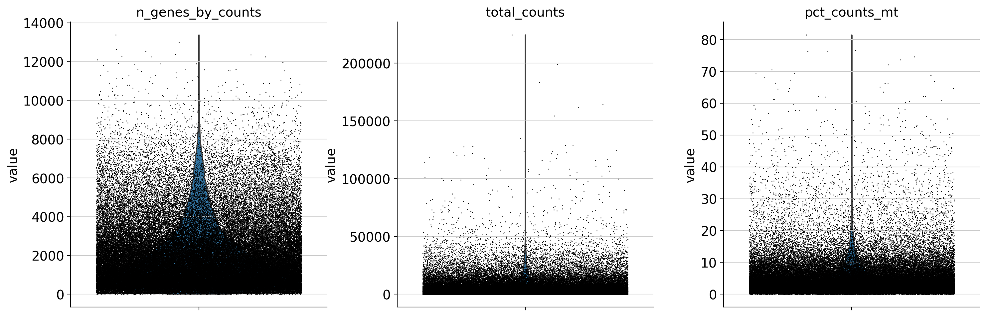

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

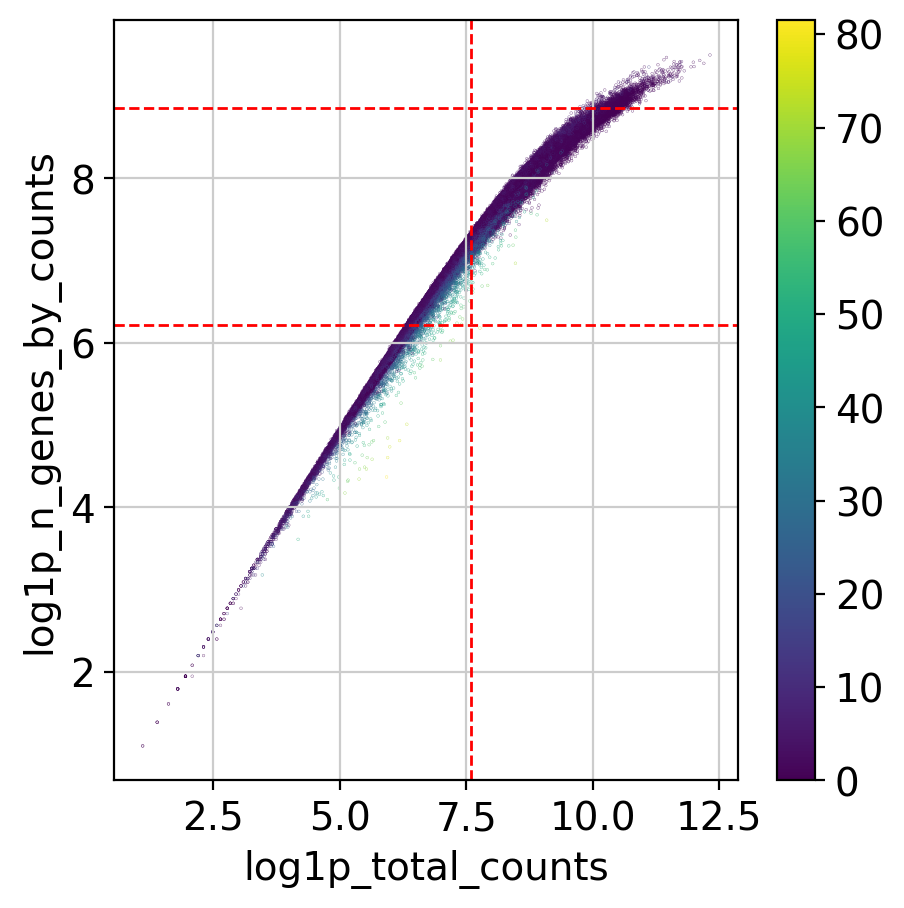

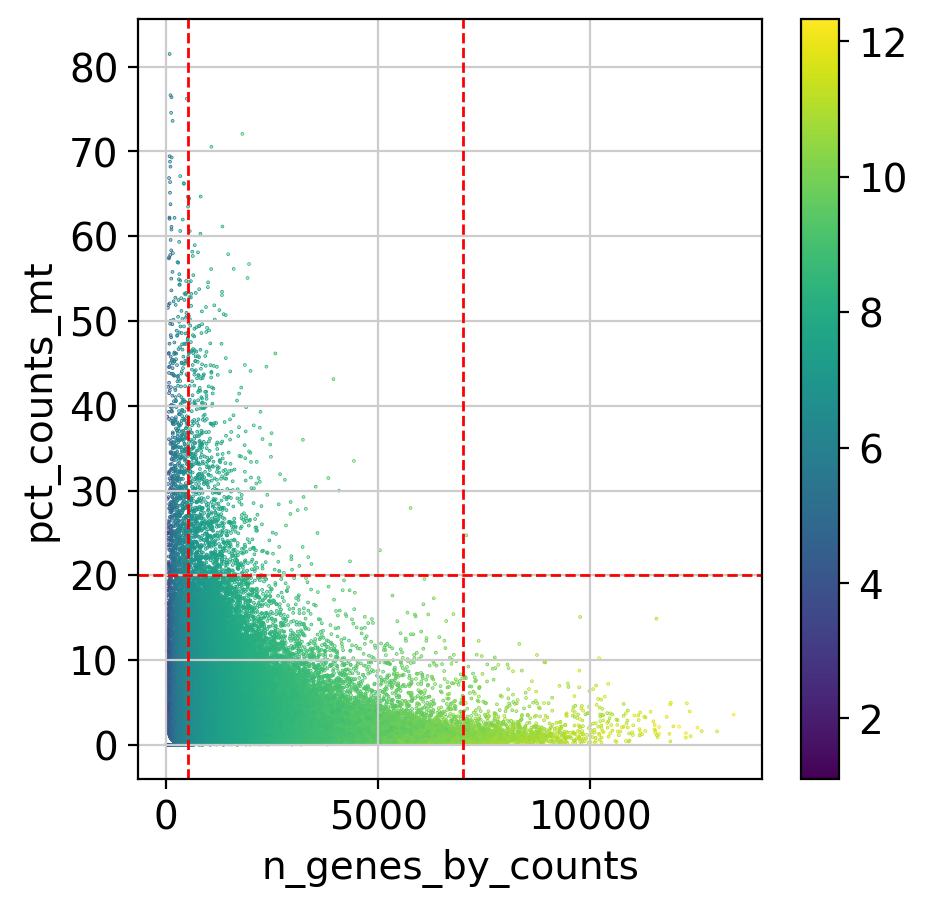

In [ ]:
plt.scatter(adata.obs['log1p_total_counts'], adata.obs['log1p_n_genes_by_counts'], c=adata.obs['pct_counts_mt'], s=0.01)
plt.axvline(x=np.log1p(2000), color='r', linestyle='--', linewidth=1) # min_counts
plt.axhline(y=np.log1p(500), color='r', linestyle='--', linewidth=1) # min_genes
plt.axhline(y=np.log1p(7000), color='r', linestyle='--', linewidth=1) # max_genes
plt.xlabel('log1p_total_counts')
plt.ylabel('log1p_n_genes_by_counts')
plt.colorbar()
plt.show()

plt.scatter(adata.obs['n_genes_by_counts'], adata.obs['pct_counts_mt'], c=adata.obs['log1p_total_counts'], s=0.1)
plt.axvline(x=500, color='r', linestyle='--', linewidth=1) # min_genes
plt.axvline(x=7000, color='r', linestyle='--', linewidth=1) # max_genes
plt.axhline(y=20, color='r', linestyle='--', linewidth=1) # max_mt
plt.xlabel('n_genes_by_counts')
plt.ylabel('pct_counts_mt')
plt.colorbar()
plt.show()

In [ ]:
adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scr.Scrublet(adata.X).scrub_doublets(verbose=False)
adata.obs['predicted_doublets'] = adata.obs['predicted_doublets'].astype(str)

In [ ]:
adata = adata[adata.obs['predicted_doublets'] == 'False', :]
adata

View of AnnData object with n_obs × n_vars = 104999 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cel

In [ ]:
sc.pp.filter_cells(adata, min_counts=1000) # 1000개 이하의 cell 을 가진 Sample 제외
sc.pp.filter_cells(adata, min_genes=500) # 500개 이하의 gene 을 가진 Sample 제외
#sc.pp.filter_cells(adata, max_genes=7000) # 7000개 이상의 gene 을 가진 Sample 제외
adata = adata[adata.obs['pct_counts_mt'] < 20, :] # 20% 이상의 mitochondria 분율을 가진 Sample 제외 (doublet 일 수 있음)

filtered out 29373 cells that have less than 1000 counts


/home/neuro_demo_research/miniconda3/envs/scenv/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:174: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


filtered out 11 cells that have less than 500 genes expressed


In [ ]:
adata.write("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 2. Preprocess

In [3]:
adata = sc.read_h5ad("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")
adata

AnnData object with n_obs × n_vars = 74582 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

In [4]:
print(adata.layers['counts'].max())
print(adata.layers['counts'].min())

4810
0


In [5]:
# normalization

print('before log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

adata.var_names_make_unique()
adata.obs_names_make_unique()

# Normalization : Sample 에서 세포 합이 모두 100,00 이 되도록 함 (Sample 간의 비교를 위해)
sc.pp.normalize_total(adata, target_sum=1e4)

# Matrix 가 잘 정규화 되었는지 확인
adata.X.sum(axis=1)

# Logarithmize
sc.pp.log1p(adata)
adata.raw = adata
print('after log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

before log1p norm
max:  4810
min:  0
mean:  0.16915023279373226
normalizing counts per cell
    finished (0:00:00)
after log1p norm
max:  7.907048
min:  0.0
mean:  0.08880692


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


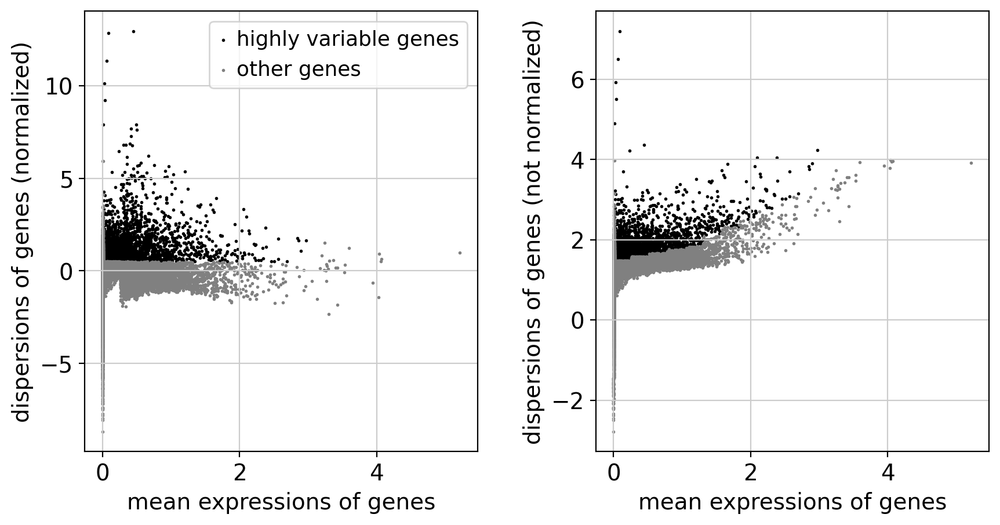

detected 4817 highly variable genes


/home/neuro_demo_research/miniconda3/envs/scenv/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [6]:
# HVG (Highly variable genes) : adata 에서 어떤 Gene 들이 많이 차이가 나는지 확인
sc.pp.highly_variable_genes(adata) # adata 에서 HVG 에 해당하는 Gene 갯수를 확인
sc.pl.highly_variable_genes(adata)
print(f"detected {np.sum(adata.var['highly_variable'])} highly variable genes")

sc.pp.scale(adata, max_value=10)

In [7]:
adata

AnnData object with n_obs × n_vars = 74582 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

# 3. Feature Selecetion

computing PCA
    with n_comps=50
    finished (0:00:14)


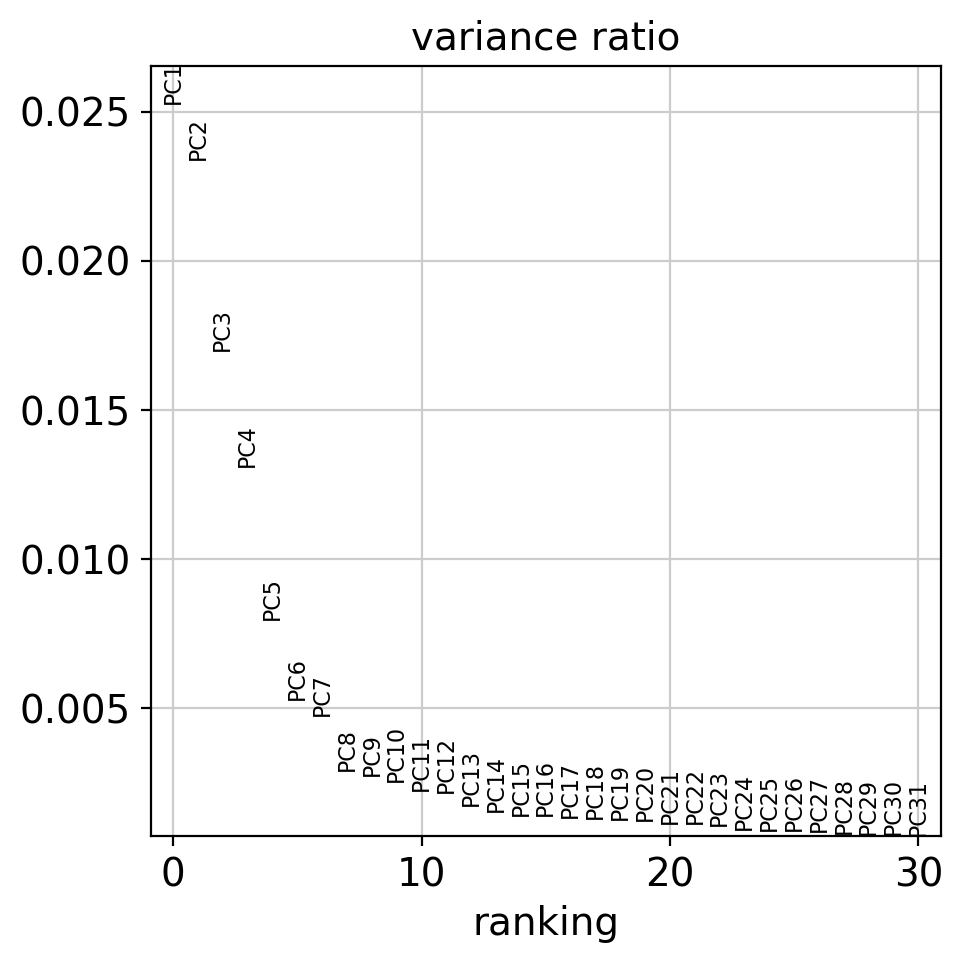

In [8]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata)

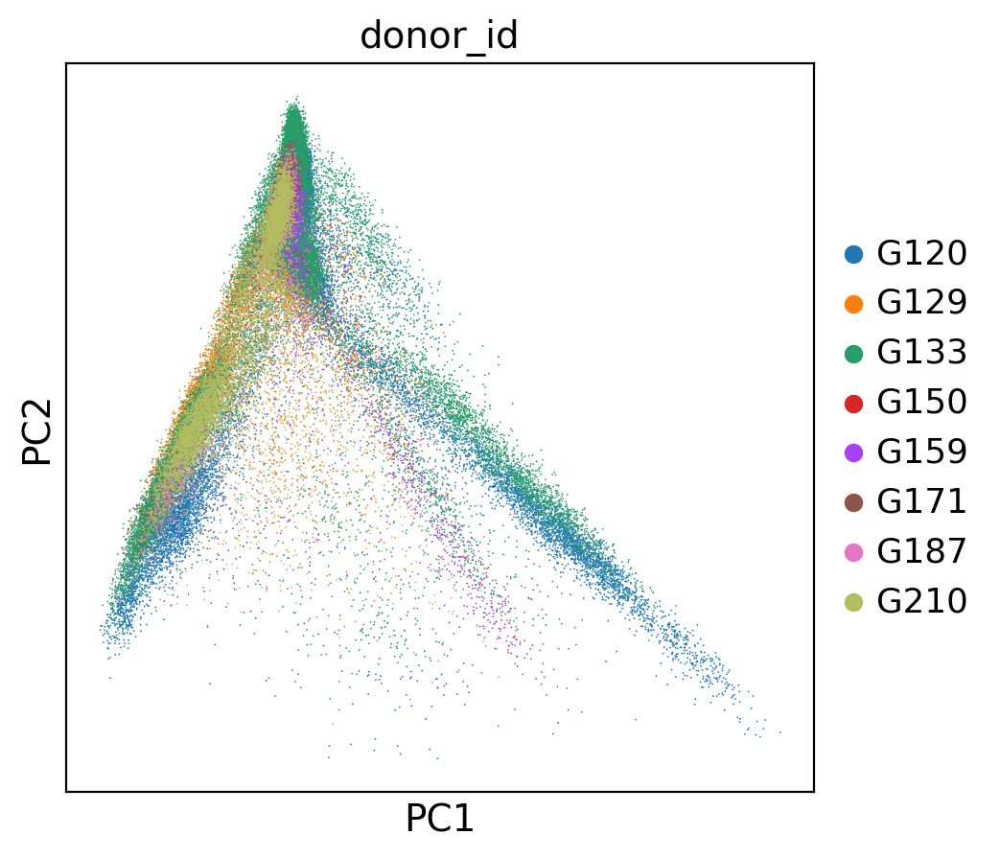

In [9]:
sc.pl.pca(adata, color = 'donor_id')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:25)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:49)


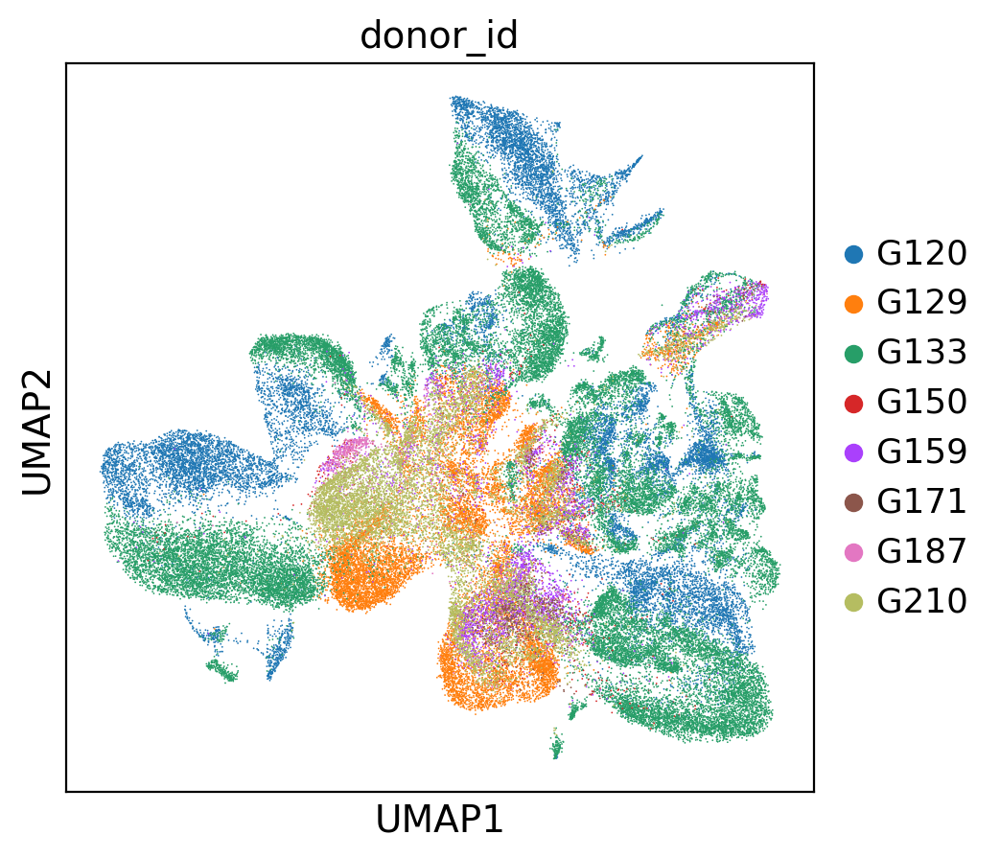

In [10]:
# without batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_harmony_npcs=20.png")

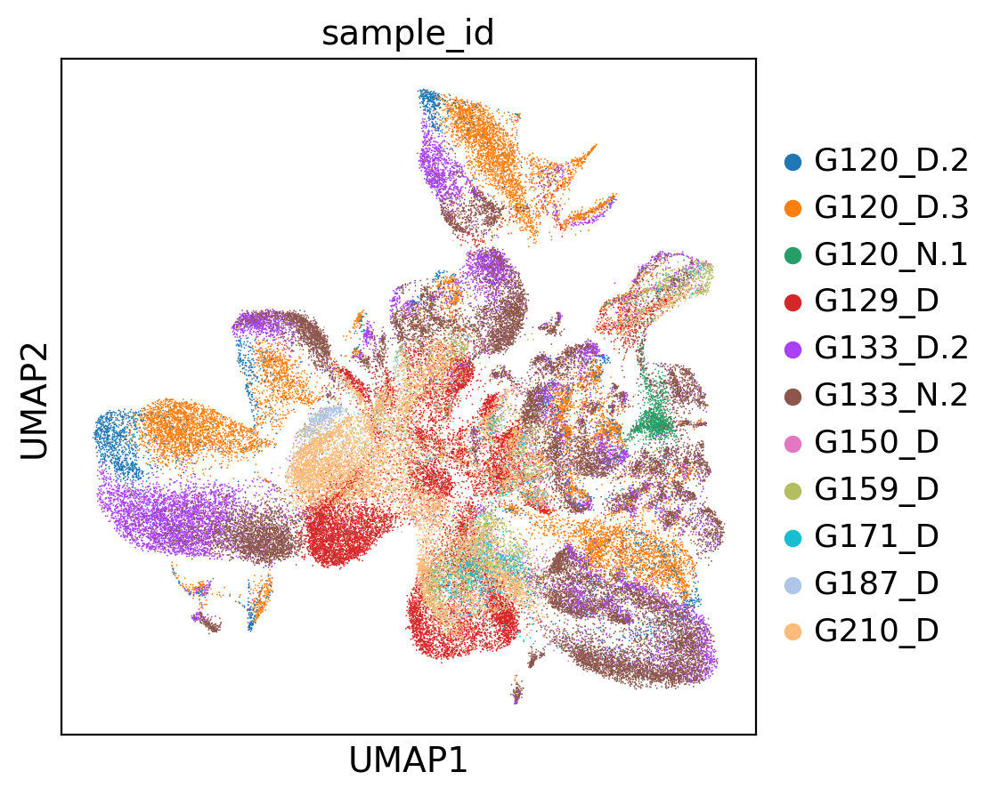

In [11]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_harmony_npcs=20.png")

In [12]:
import harmonypy as hm

ho = hm.run_harmony(
    adata.obsm["X_pca"].astype(np.float64),
    adata.obs,
    "sample_id",
    max_iter_harmony=50
)

print(ho.Z_corr.shape)
adata.obsm["X_pca_harmony"] = np.asarray(ho.Z_corr)

2026-09-08 02:12:59,177 - harmonypy - INFO - Running Harmony
2026-09-08 02:12:59,178 - harmonypy - INFO -   Parameters:
2026-09-08 02:12:59,178 - harmonypy - INFO -     max_iter_harmony: 50
2026-09-08 02:12:59,178 - harmonypy - INFO -     max_iter_kmeans: 4
2026-09-08 02:12:59,179 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-09-08 02:12:59,179 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-09-08 02:12:59,179 - harmonypy - INFO -     nclust: 100
2026-09-08 02:12:59,179 - harmonypy - INFO -     block_size: 0.05
2026-09-08 02:12:59,180 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-09-08 02:12:59,180 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-09-08 02:12:59,180 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-09-08 02:12:59,181 - harmonypy - INFO -     verbose: True
2026-09-08 02:12:59,181 - harmonypy - INFO -     random_state: 0
2026-09-08 02:12:59,181 - harmonypy - INFO -   Data: 50 PCs × 74582 cells
2026-09-08 02:12:59,182

2026-09-08 02:12:59,275 - harmonypy - INFO - Computing initial centroids...
2026-09-08 02:13:01,831 - harmonypy - INFO - Initialization complete.
2026-09-08 02:13:01,831 - harmonypy - INFO - Iteration 1 of 50
2026-09-08 02:13:03,507 - harmonypy - INFO - Iteration 2 of 50
2026-09-08 02:13:05,275 - harmonypy - INFO - Iteration 3 of 50
2026-09-08 02:13:07,078 - harmonypy - INFO - Iteration 4 of 50
2026-09-08 02:13:08,854 - harmonypy - INFO - Iteration 5 of 50
2026-09-08 02:13:10,650 - harmonypy - INFO - Iteration 6 of 50
2026-09-08 02:13:12,437 - harmonypy - INFO - Iteration 7 of 50
2026-09-08 02:13:14,216 - harmonypy - INFO - Iteration 8 of 50
2026-09-08 02:13:16,014 - harmonypy - INFO - Converged after 8 iterations


(74582, 50)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:46)


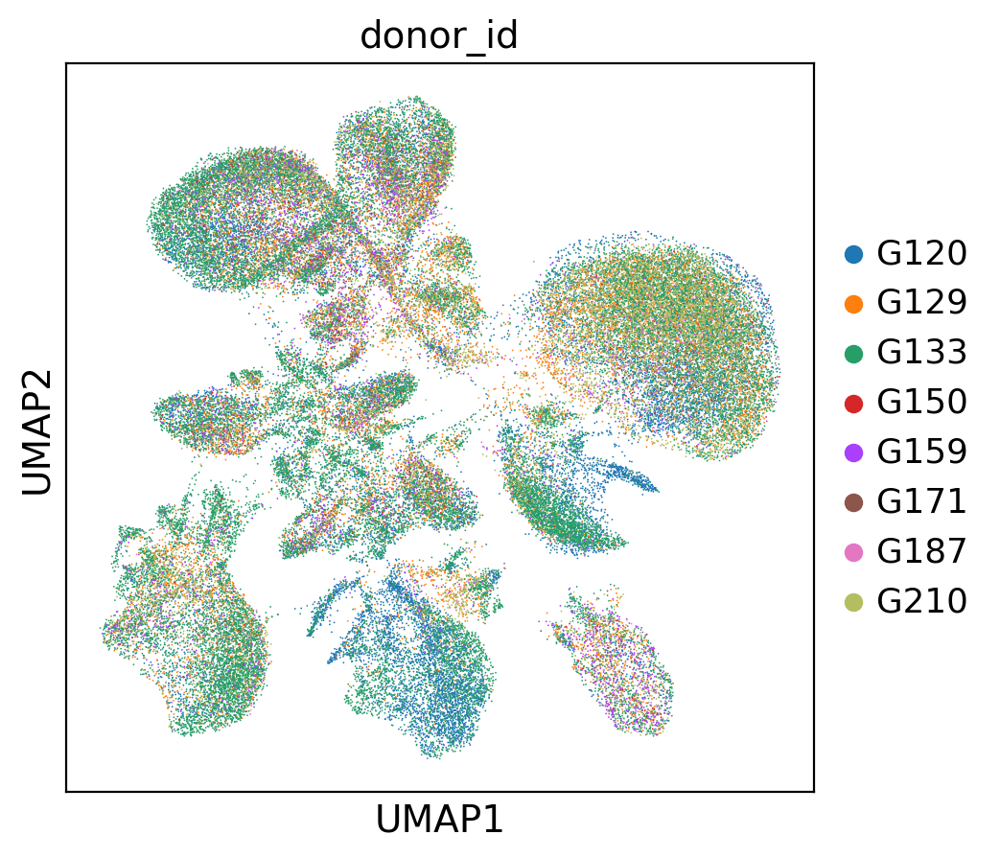

In [13]:
# with batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_harmony_npcs=20.png")

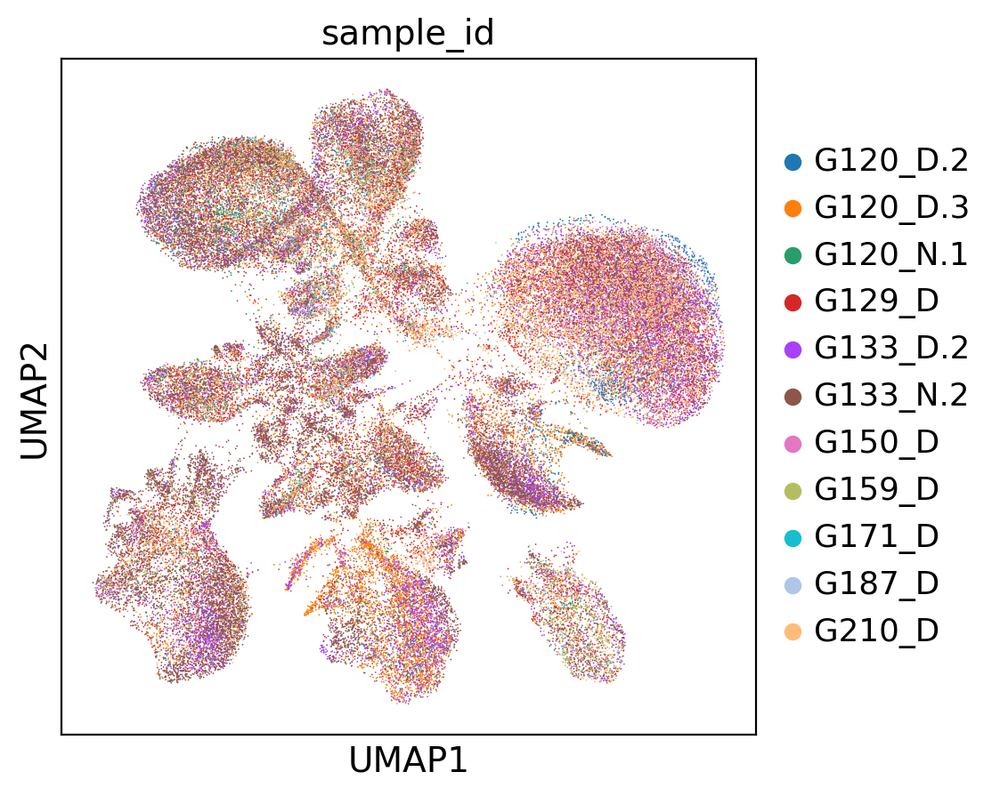

In [15]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_harmony_sample_npcs=20.png")

In [16]:
adata.write("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 4. Annotation

In [5]:
adata = sc.read_h5ad("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")
adata

AnnData object with n_obs × n_vars = 74582 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

In [6]:
sc.tl.leiden(adata, resolution=1.0, key_added = "leiden_1.0", random_state=random_seed)

running Leiden clustering


/tmp/ipykernel_38807/600802659.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.0, key_added = "leiden_1.0", random_state=random_seed)


    finished: found 30 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:15)


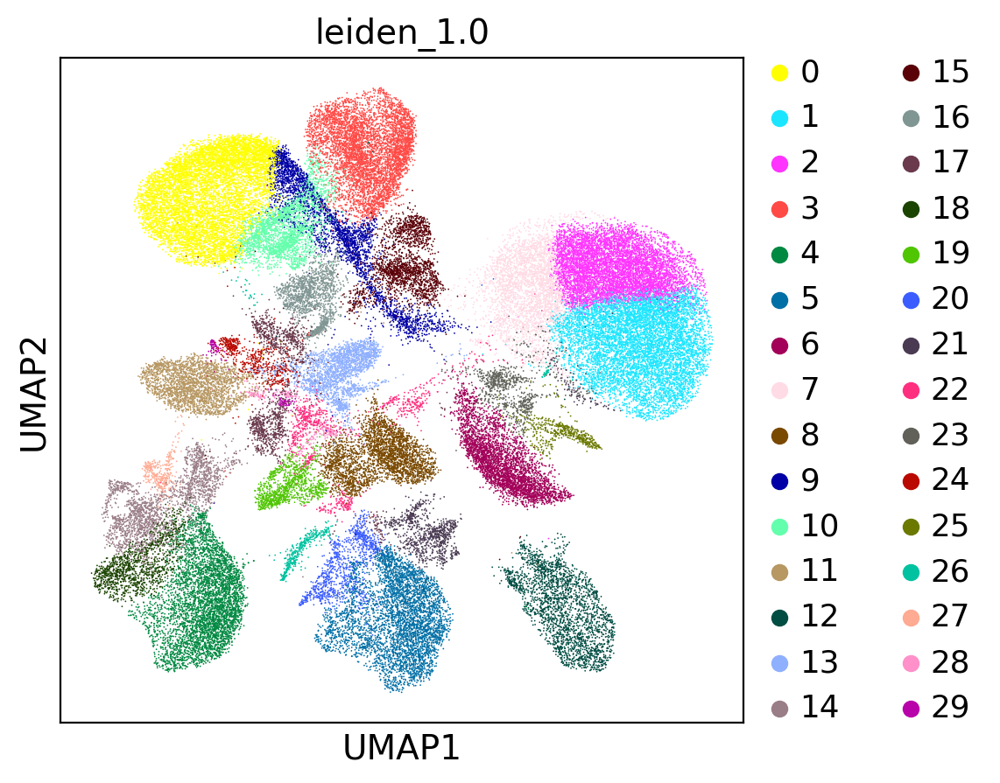

In [4]:
sc.pl.umap(adata, color="leiden_1.0", save=f"_{TODAY}_leiden_1.0.png")

In [ ]:
adata.write("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

In [ ]:
adata.var_names = adata.var['gene_symbol'].astype(str)
adata.var_names_make_unique()
adata.var

,source_gene_id,gene_symbol,feature_type,chromosome,source_start,source_end,cellxgene_feature_name,cellxgene_feature_reference,cellxgene_feature_biotype,cellxgene_feature_length,...,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
gene_symbol,,,,,,,,,,,,,,,,,,,,,
MIR1302-2HG,ENSG00000243485,MIR1302-2HG,Gene Expression,chr1,29553,30267,MIR1302-2HG,NCBITaxon:9606,gene,517,...,0.000066,99.993414,7,2.079442,False,2.348438e-04,1.239340,0.000253,0.000105,0.012136
FAM138A,ENSG00000237613,FAM138A,Gene Expression,chr1,36080,36081,FAM138A,NCBITaxon:9606,gene,1015,...,0.000000,100.000000,0,0.000000,False,1.000000e-12,NaN,NaN,0.000000,1.000000
OR4F5,ENSG00000186092,OR4F5,Gene Expression,chr1,65418,69055,OR4F5,NCBITaxon:9606,gene,2618,...,0.000028,99.997178,3,1.386294,False,3.659394e-05,0.661157,-1.248025,0.000021,0.004473
AL627309.1,ENSG00000238009,AL627309.1,Gene Expression,chr1,120931,133723,NaN,NaN,NaN,NaN,...,0.005807,99.427039,619,6.429719,False,1.373770e-02,1.343241,0.224573,0.006564,0.089264
AL627309.3,ENSG00000239945,AL627309.3,Gene Expression,chr1,91104,91105,ENSG00000239945,NCBITaxon:9606,gene,1319,...,0.000273,99.972716,29,3.401197,False,6.042628e-04,1.146902,-0.199317,0.000306,0.018650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,ENSG00000277836,AC141272.1,Gene Expression,KI270728.1,1270983,1270984,ENSG00000277836,NCBITaxon:9606,gene,288,...,0.000000,100.000000,0,0.000000,False,1.000000e-12,NaN,NaN,0.000000,1.000000
AC023491.2,ENSG00000278633,AC023491.2,Gene Expression,KI270731.1,13000,13001,ENSG00000278633,NCBITaxon:9606,gene,2404,...,0.000038,99.996237,4,1.609438,False,2.249685e-05,-0.643988,-4.065791,0.000018,0.002690
AC007325.1,ENSG00000276017,AC007325.1,Gene Expression,KI270734.1,72410,72411,ENSG00000276017,NCBITaxon:9606,gene,2404,...,0.000047,99.995296,5,1.791759,False,1.217507e-04,1.192342,-0.101214,0.000060,0.008404


In [1]:
sc.tl.rank_genes_groups(adata, 'leiden_1.0', method='wilcoxon', use_raw=False)

NameError: name 'sc' is not defined

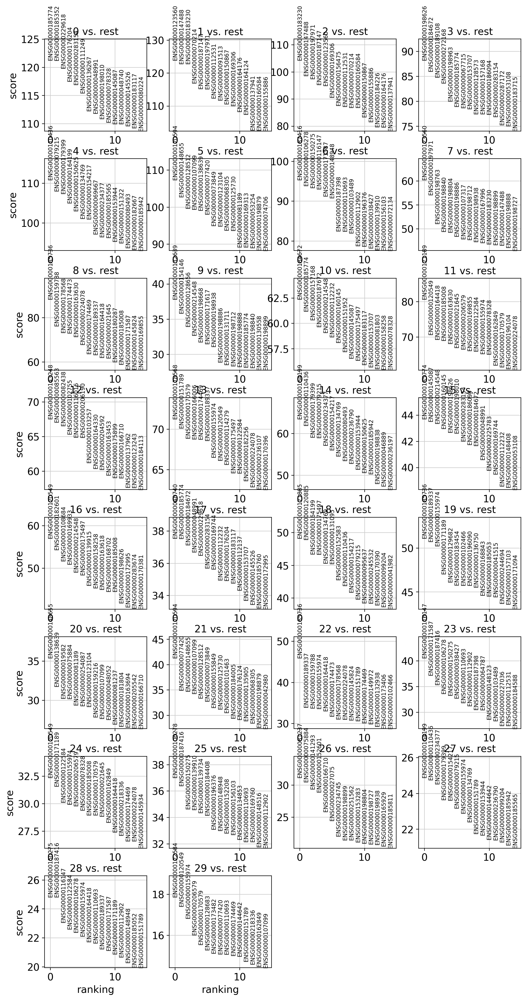

In [ ]:
with plt.rc_context({"figure.figsize":(3,3)}):
  sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

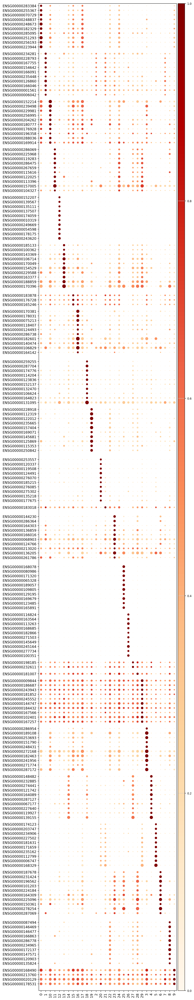

{np.str_('0'): ['ENSG00000283384',
  'ENSG00000255367',
  'ENSG00000070729',
  'ENSG00000248837',
  'ENSG00000248673',
  'ENSG00000182329',
  'ENSG00000285095',
  'ENSG00000251293',
  'ENSG00000256193',
  'ENSG00000223944'],
 np.str_('1'): ['ENSG00000234281',
  'ENSG00000228793',
  'ENSG00000167755',
  'ENSG00000154642',
  'ENSG00000166091',
  'ENSG00000235448',
  'ENSG00000126860',
  'ENSG00000166046',
  'ENSG00000001561',
  'ENSG00000006042'],
 np.str_('10'): ['ENSG00000152214',
  'ENSG00000239498',
  'ENSG00000229981',
  'ENSG00000256995',
  'ENSG00000204262',
  'ENSG00000180777',
  'ENSG00000176928',
  'ENSG00000196358',
  'ENSG00000288036',
  'ENSG00000169914'],
 np.str_('11'): ['ENSG00000286069',
  'ENSG00000225968',
  'ENSG00000119283',
  'ENSG00000286475',
  'ENSG00000267659',
  'ENSG00000115616',
  'ENSG00000122025',
  'ENSG00000113396',
  'ENSG00000157005',
  'ENSG00000104327'],
 np.str_('12'): ['ENSG00000152207',
  'ENSG00000139567',
  'ENSG00000135111',
  'ENSG00000137507',

In [ ]:
import sceleto2 as scl
M = scl.markers.marker(adata, 'leiden_1.0', use_raw=False)
M.plot_marker()

In [ ]:
import sceleto2 as scl
M = scl.markers.marker(adata, 'leiden_1.0', use_raw = False)
M.plot_markers()